In [1]:
import numpy as np
import scipy as sp
import pandas as pd
from scipy.ndimage.filters import gaussian_filter
import matplotlib.pyplot as plt
plt.style.use('default')
%matplotlib inline


def load_npz(filename):
    """
    load npz files with sparse matrix and dimension
    output dense matrix with the correct dim
    """
    npzfile = np.load(filename, allow_pickle=True) 
    sparse_matrix = npzfile['arr_0'][0]
    ndim=npzfile['arr_0'][1]

    new_matrix_2d = np.array(sparse_matrix.todense())
    new_matrix = new_matrix_2d.reshape(ndim)
    return new_matrix



<module 'ccg_layer' from '/Users/xiaoxuanj/work/work_allen/Ephys/code_library/ephys_code/ccg_layer.pyc'>

In [2]:
color_bank = {'probeA':'r',
             'probeB':'brown',
             'probeC': '#E3CF57',
             'probeD': 'green',
             'probeE': 'purple',
             'probeF': 'blue'}
colors = ['#E3CF57', 'green', 'purple', 'blue', 'brown', 'r', 'b','g','gray']

probe_area={'probeA':'AM',
             'probeB':'PM',
             'probeC': 'V1',
             'probeD': 'LM',
             'probeE': 'AL',
             'probeF': 'RL'}

#areas_all = ['LGd','VISp','VISl', 'VISrl', 'VISal', 'VISpm', 'VISam',  'LP']
areas_all = ['VISp','VISl', 'VISrl', 'VISal', 'VISpm', 'VISam']



In [130]:
from scipy import stats
def combine_p_Fisher(P, df=1):
    """
    df is degree of freedom
    When all the null hypotheses are true, and the pi (or their corresponding test statistics) are independent, 
    X2 has a chi-squared distribution with 2k degrees of freedom, where k is the number of tests being combined. 
    """
    k=len(P)
    chi2 = -2*np.sum(np.log(P))
    p = 1 - stats.chi2.cdf(chi2, 2*k)
    return chi2, p

def boot_sample(tmp, k, replace=True):
    return np.random.choice(tmp, size=k, replace=replace)

# calculate bootstrapped distribution of median for each mouse

412804
412809
415149
416356
416357
416861
419112
419114
419116
419117
419118
419119
424445
434488
437661
448503
433891
432105
432104
437660
429857
434494
425597
415148
418196


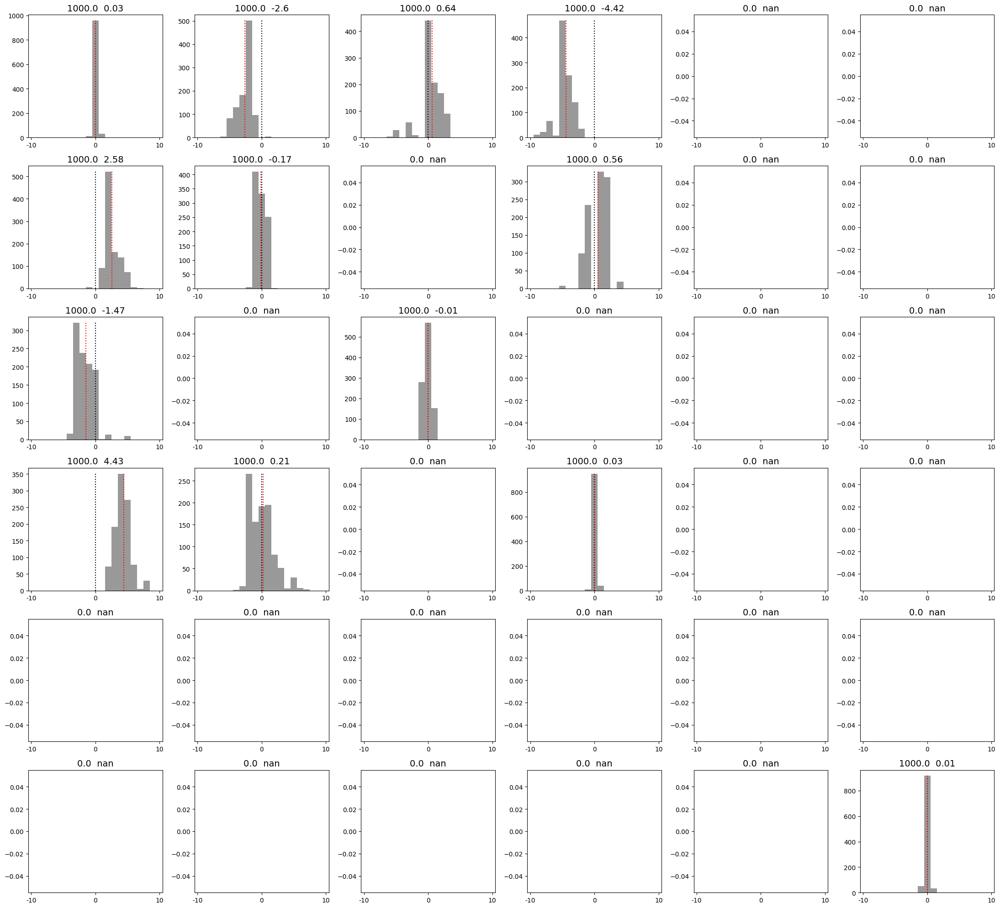

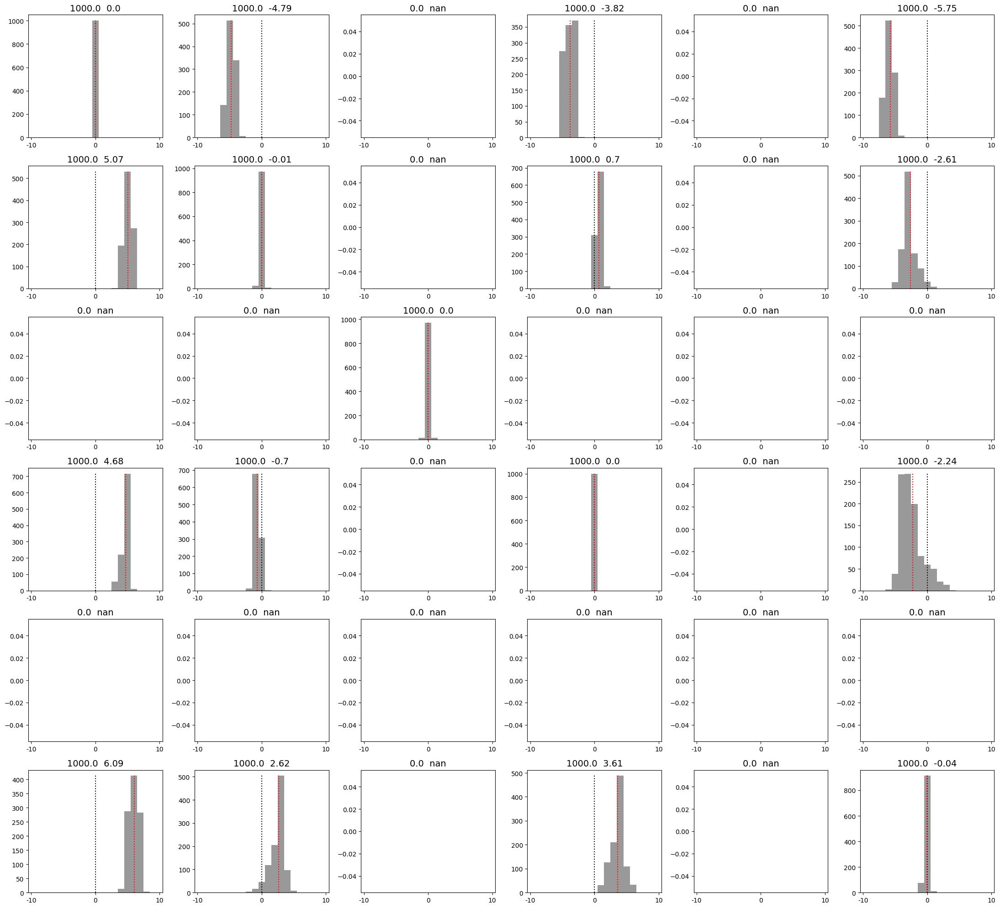

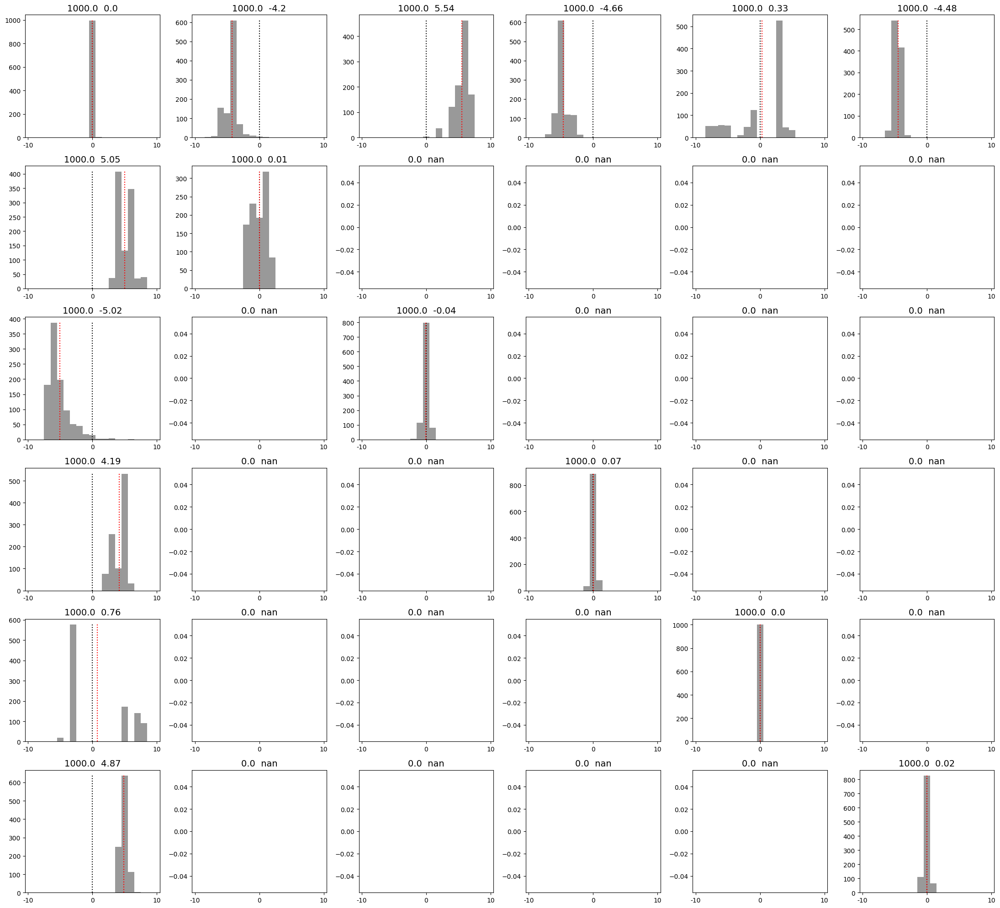

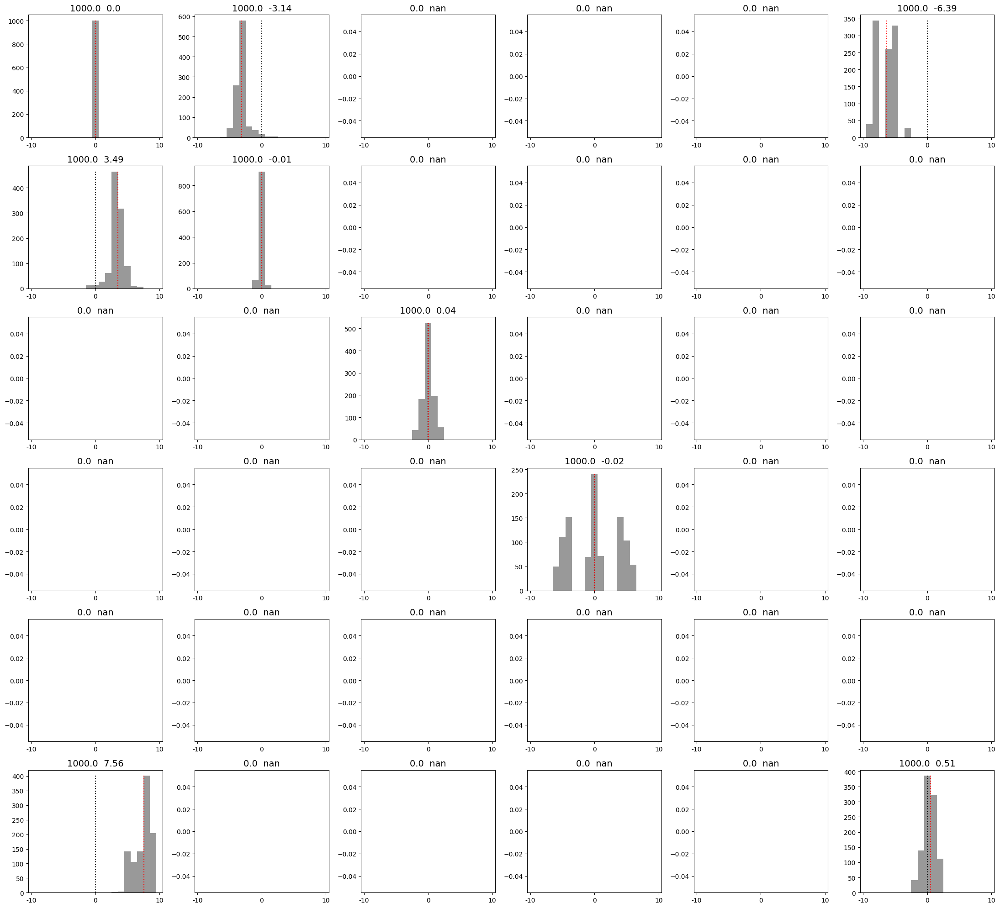

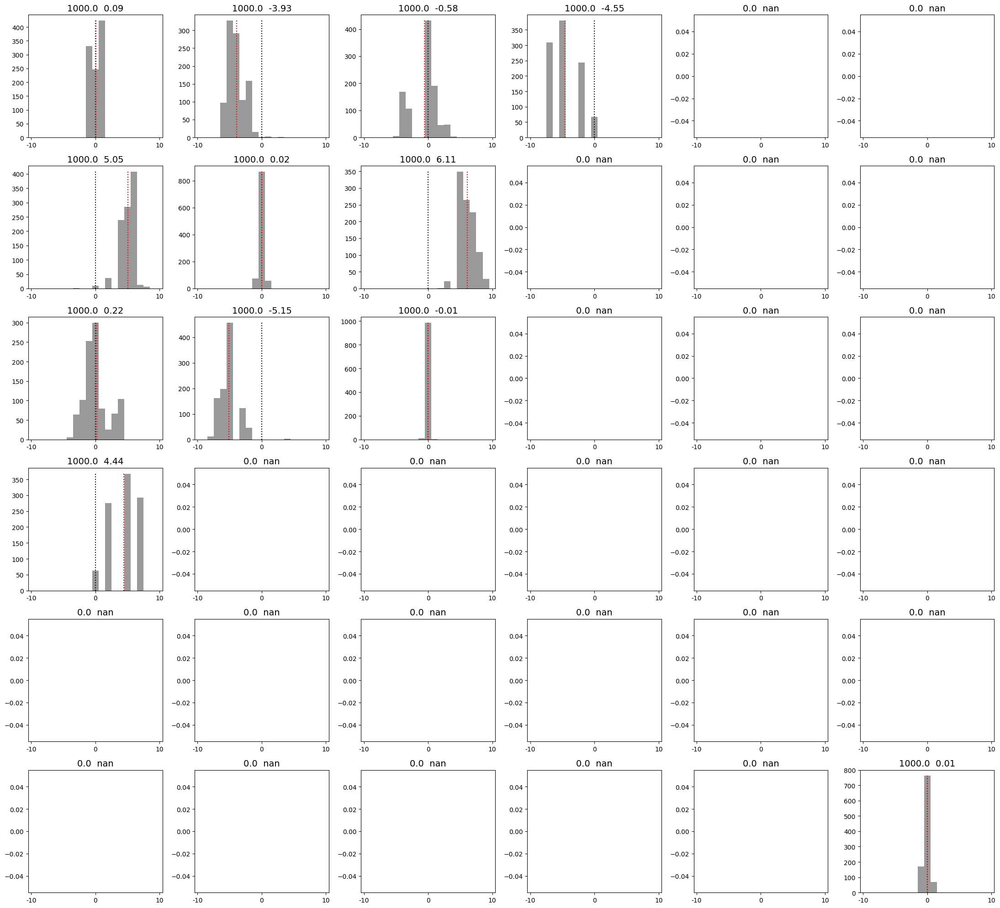

...

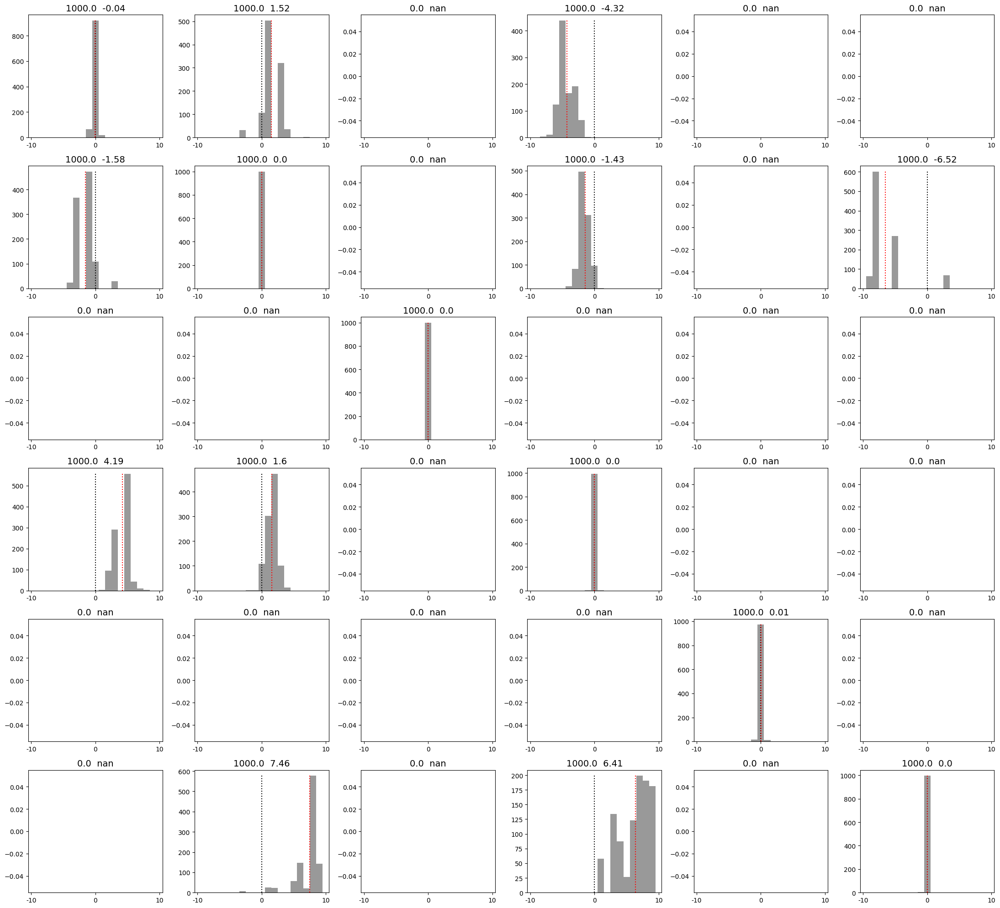

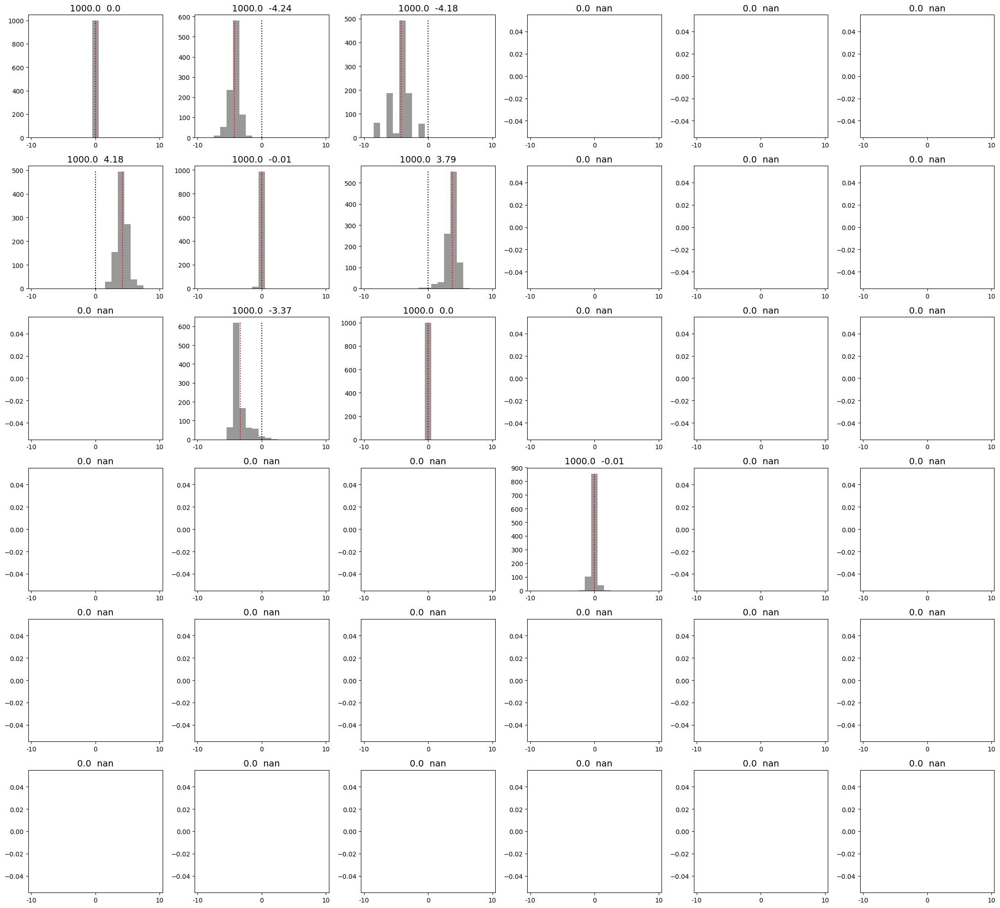

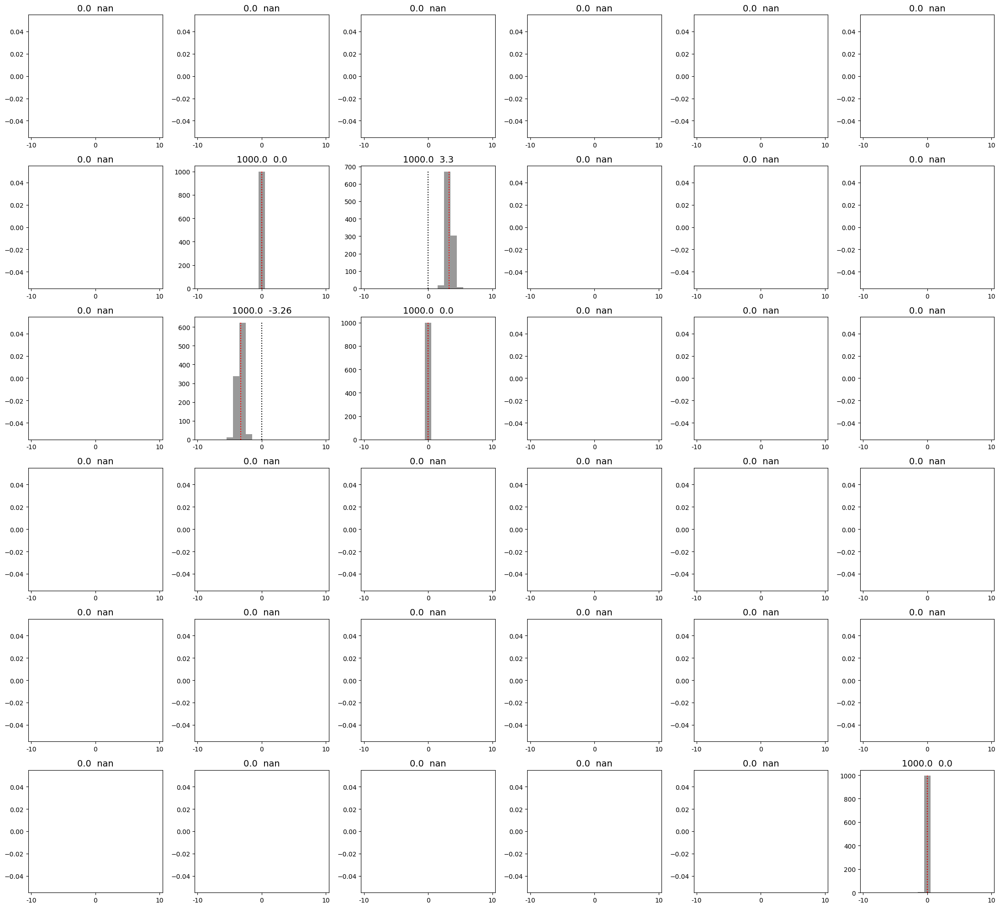

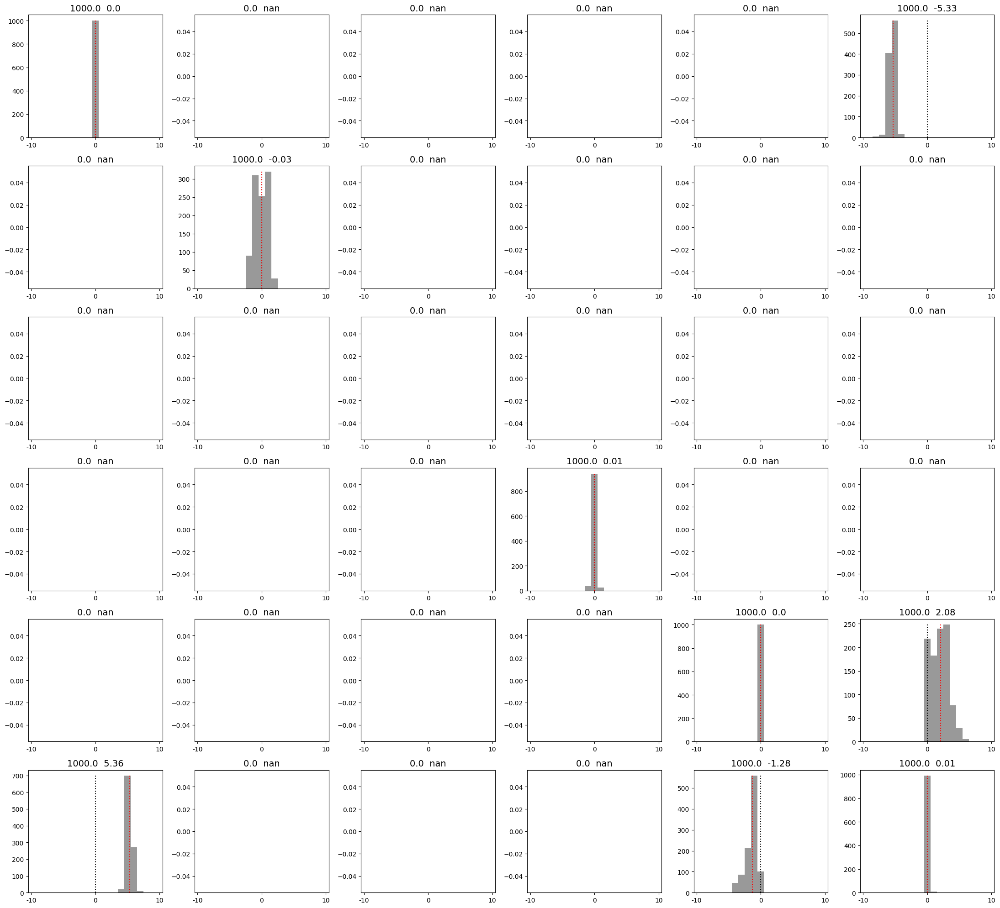

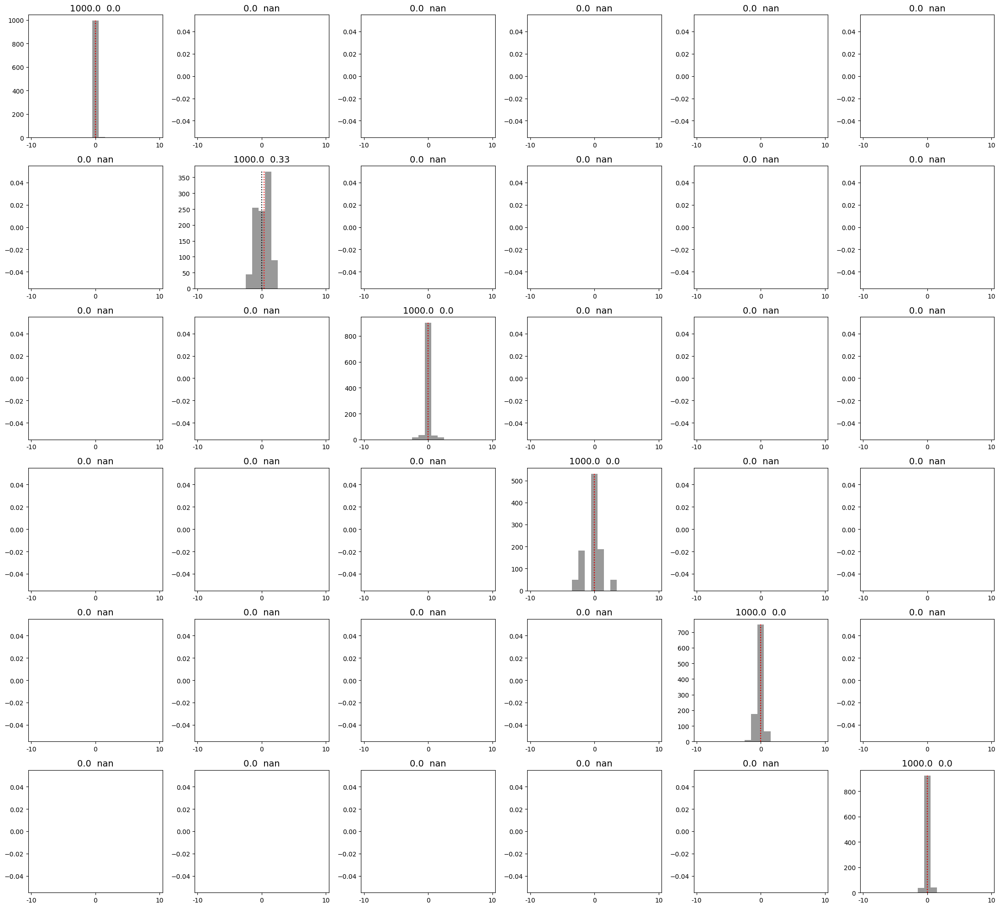

In [25]:
basetype='CCG_grating_full_qc_high'
# load sharp peak with both threshold and window constraints
std=str(7)+str(10)
datatype= std+'std '+basetype

m=len(areas_all)

Verbose = True

mouse_IDs = ['412804', '412809', '415149','416356', '416357','416861','419112', '419114', '419116', 
             '419117', '419118', '419119', '424445',
             '434488','437661','448503',
              '433891', '432105', '432104',
            '437660', '429857', '434494',
            '425597', '415148', '418196']  #  need to process width, removed 394208, 434836, 434845 because of lims

n_boot=1000
W_all=[]
P_all=[]
for mouse_ID in mouse_IDs:
    print(mouse_ID)
    basepath = '/Volumes/local1/work_allen/Ephys/resorted/mouse'+mouse_ID

    df = pd.read_csv(basepath+'/matrix/mouse'+mouse_ID+'_all_qc_meta.csv')
    df = df[df.FR>2]

    # add new column with grouped area ids
    areas = ['LGd', #LGN
             'VISp', 'VISl', 'VISal', 'VISrl', 'VISam', 'VISpm', 'VISmma', #VIS
             'LP','TH', # thalamus
             'MB','MGm', 'MGv', 'MGd', 'APN','Eth','POL','ProS' ,'NOT', 'VPM','RPF','SGN', 'PRE', 'POST', 'SUB', 'HPF', 'ZI', 'IntG', # others
             'DG','CA1', 'CA3', # hippo
             'none'   # not labeled
            ]

    df['areas_group']=np.zeros(len(df))
    for a in areas:
        df['areas_group'][df['ccf'].str.contains(a, case=False, na=False, regex=False)]=a

    ccg_basepath = '/Users/xiaoxuanj/work/work_allen/Ephys/processed_data/CCG_peak/mouse'
    ccg_peak = dl.load_npz(ccg_basepath+mouse_ID+'/ccg_peak_'+datatype+'.npz')
    ccg_peak_idx = dl.load_npz(ccg_basepath+mouse_ID+'/ccg_peak_offset_'+datatype+'.npz')
    areas = df.areas_group.unique()

    w, h = m, m;
    #CCG_amp = [[[] for x in range(w)] for y in range(h)] 
    CCG_offset = [[[] for x in range(w)] for y in range(h)] 

    for i, probei in enumerate(areas_all):
        for j, probej in enumerate(areas_all):
            if probei in areas and probej in areas:
                select_idxi = np.where(df.areas_group==probei)[0]
                select_idxj = np.where(df.areas_group==probej)[0]

                # mean amplitude for each pair of areas
                tmp = ccg_peak[select_idxi, :][:, select_idxj].flatten()
                # only consider significant positive connections
                select_peak = np.where(tmp!=0)[0]
                #print(len(select_peak))
                peak = np.nanmean(tmp[select_peak])
                # median peak offset for each pair
                tmp = ccg_peak_idx[select_idxi, :][:, select_idxj].flatten()
                tmp = tmp[select_peak]-100
                
                if len(tmp)>3:
                    # for each pair of areas, compute bootstrapped distributions (n_boot=1000), replace=True
                    peak_idx_boot=[]
                    for k in range(n_boot):
                        peak_idx_boot.append(np.nanmedian(np.random.choice(tmp, size=len(tmp), replace=True)))

                    # ccg peak offset distribution
                    CCG_offset[i][j] = CCG_offset[i][j]+peak_idx_boot
                
    
    # compute pairwise statistics:
    # Then for each pairs of hierarchically consecutive areas, compute the p-values from Wilcoxon paired signed rank sum test 
    # (See the section under # In[]: Wilcoxon matched pairs signed rank sum test). If the p-value is above 0.05, 
    # then those pairs cannot be meaningfully separated into different hierarchy levels.
    W=np.zeros((m-1, m))*np.NaN
    P=np.zeros((m-1, m))*np.NaN
    for i, probei in enumerate(areas_all[:-1]):
        for j, probej in enumerate(areas_all):
            if len(CCG_offset[i][j])>0 and len(CCG_offset[i+1][j])>0:
                w, p = stats.wilcoxon(np.array(CCG_offset[i+1][j])-np.array(CCG_offset[i][j]))
                W[i,j]=w
                P[i,j]=p
    P_all.append(P)
    W_all.append(W)
    
    plt.figure(figsize=(22,20))
    N_connection=np.zeros((m,m))
    M=np.zeros((m,m))
    for i in range(m):
        for j in range(m):
            plt.subplot(m,m,i*m+j+1)
            a, bins, c = plt.hist(CCG_offset[i][j], bins=np.arange(-10,10,1), color='gray', alpha=0.8)
            #plt.title(areas_all[j]+'-'+areas_all[i], fontsize=15)
            plt.plot([-0.50,-0.50], [0, max(a)], ':k')
            # mean of bootstrapped median
            md = round(np.nanmean(CCG_offset[i][j]), 2)
            plt.plot([md+0.5,md+0.5], [0, max(a)], ':r')
            plt.xticks([-10.5,-0.5,9.5],[-10,0,10])
            plt.title(str(sum(a))+'  '+str(md+1), fontsize=14)
            #plt.title(str(area_names[i])+'-'+str(area_names[j]), fontsize=14)
            N_connection[i,j]=sum(a)
            M[i,j]=md+1
    plt.tight_layout()



In [22]:
np.shape(CCG_offset)

(6, 6)

In [46]:
W_all=np.array(W_all)
P_all=np.array(P_all)

In [131]:
p_total=np.ones((5,6))
for i in range(5):
    for j in range(6):
        tmp = P_all[:,i,j]
        ttmp=tmp[np.isnan(tmp)!=1]
        print(ttmp)
        chi2, p = combine_p_Fisher(ttmp)
        p_total[i, j]=p

[3.41985556e-02 4.31042189e-24 1.06605395e-06 2.53734492e-03
 1.17408602e-02 8.98748141e-02 2.59423019e-08 8.52266363e-03
 2.04702687e-10 2.08224944e-03 4.25565062e-05 2.06187449e-01
 9.93473608e-08 8.58556028e-02]
[1.26437660e-02 1.27237360e-17 2.01936611e-02 2.21034651e-02
 1.45126311e-02 9.42643068e-02 2.17821634e-06 1.12145895e-03
 2.43130290e-08 4.46319076e-04 3.80517915e-06 1.51356497e-01
 9.43315661e-07 9.02692531e-02]
[9.18238351e-02 7.72058970e-01 1.24878116e-03 5.97561742e-06
 1.15805338e-02]
[1.08963542e-02 5.43848134e-08 6.31242217e-02 3.17310508e-01
 5.28075114e-02 2.74338267e-05 6.06019697e-02 2.97211354e-04
 1.21335250e-01 1.05250093e-02 2.20671362e-01]
[0.29762147 0.01002485 0.46421431 0.12133525]
[0.31731051 0.00867882 0.27332168 1.         0.48745329 0.14323491]
[4.17788570e-02 9.81324641e-01 2.70793240e-04 2.82767025e-02
 1.62457588e-03 2.08851201e-01 5.69764368e-01]
[2.12314615e-02 8.66526950e-02 1.64914823e-01 1.76296374e-01
 9.65508625e-03 1.00000000e+00 2.2779999

# directly compute distribution difference between area

412804
412809
415149
416356
416357
416861
419112
419114
419116
419117
419118
419119
424445
434488
437661
448503
433891
432105
432104
437660
429857
434494
425597
415148
418196


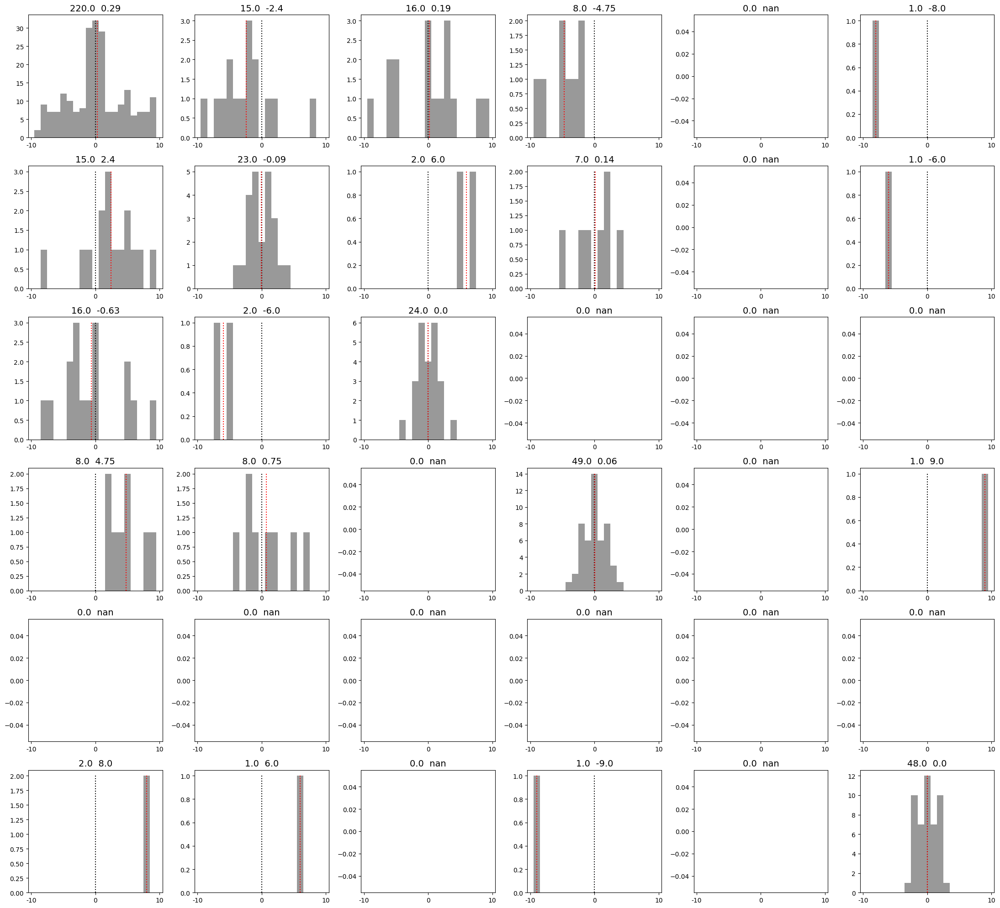

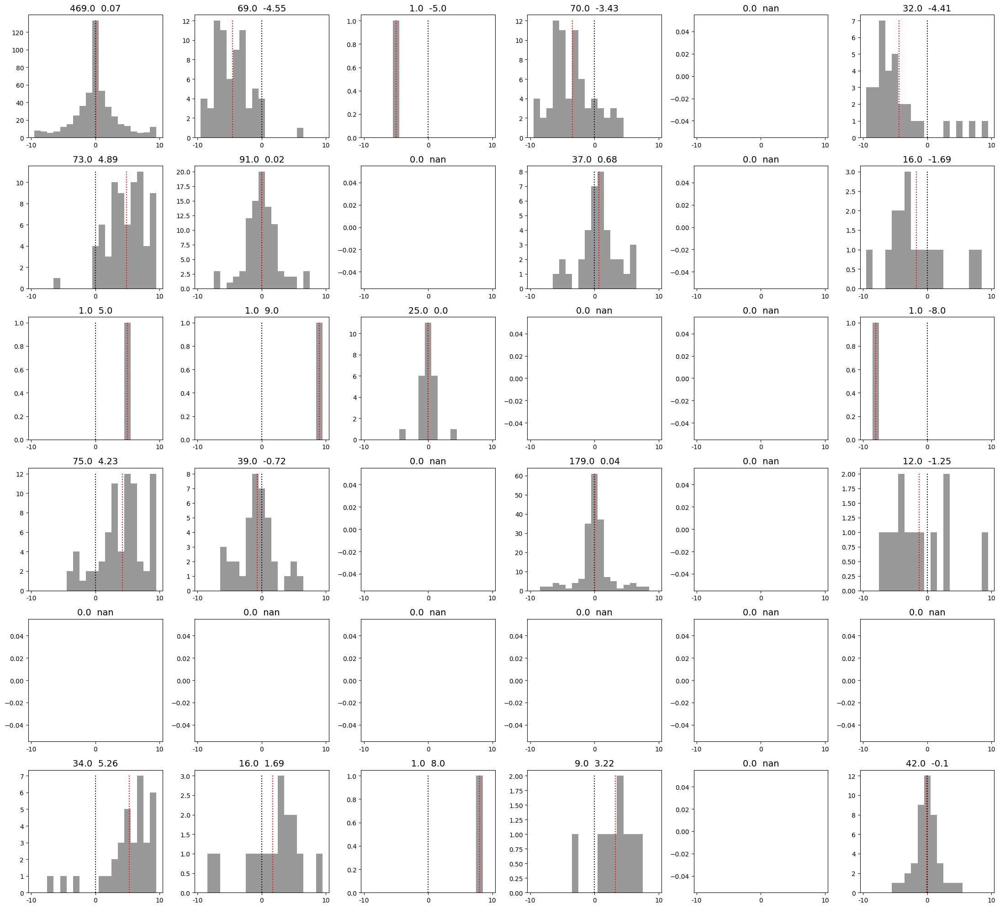

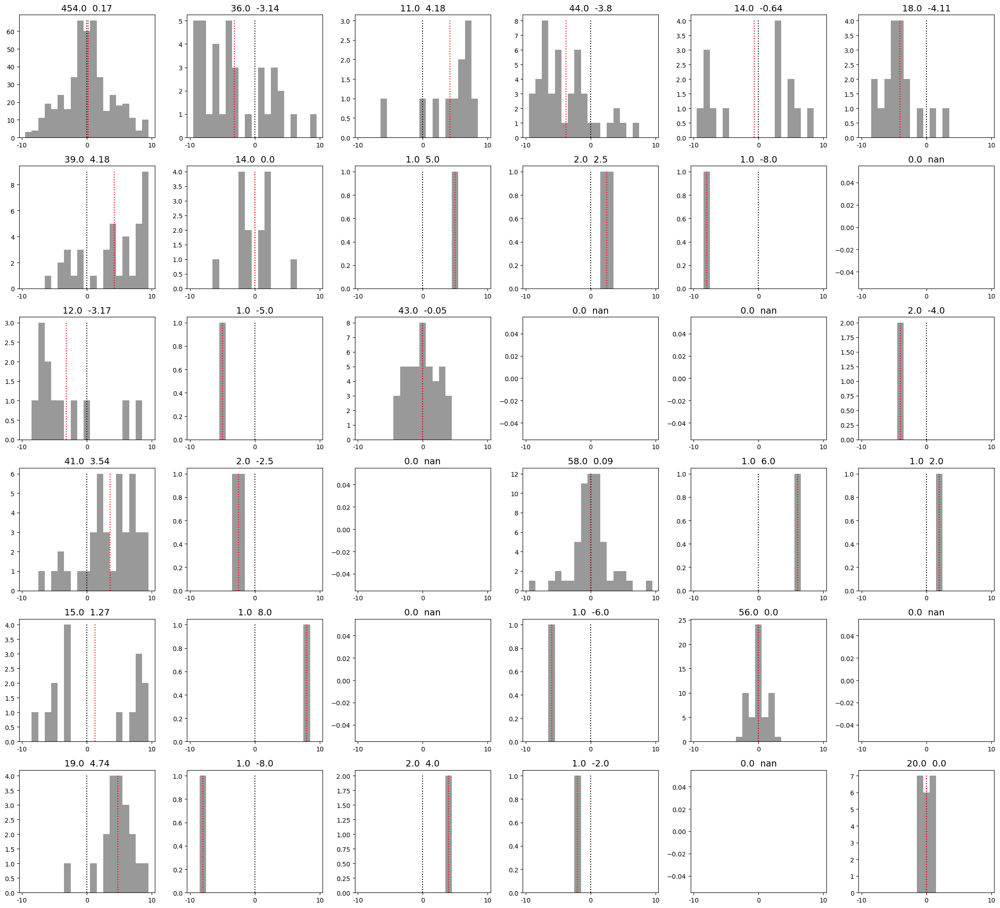

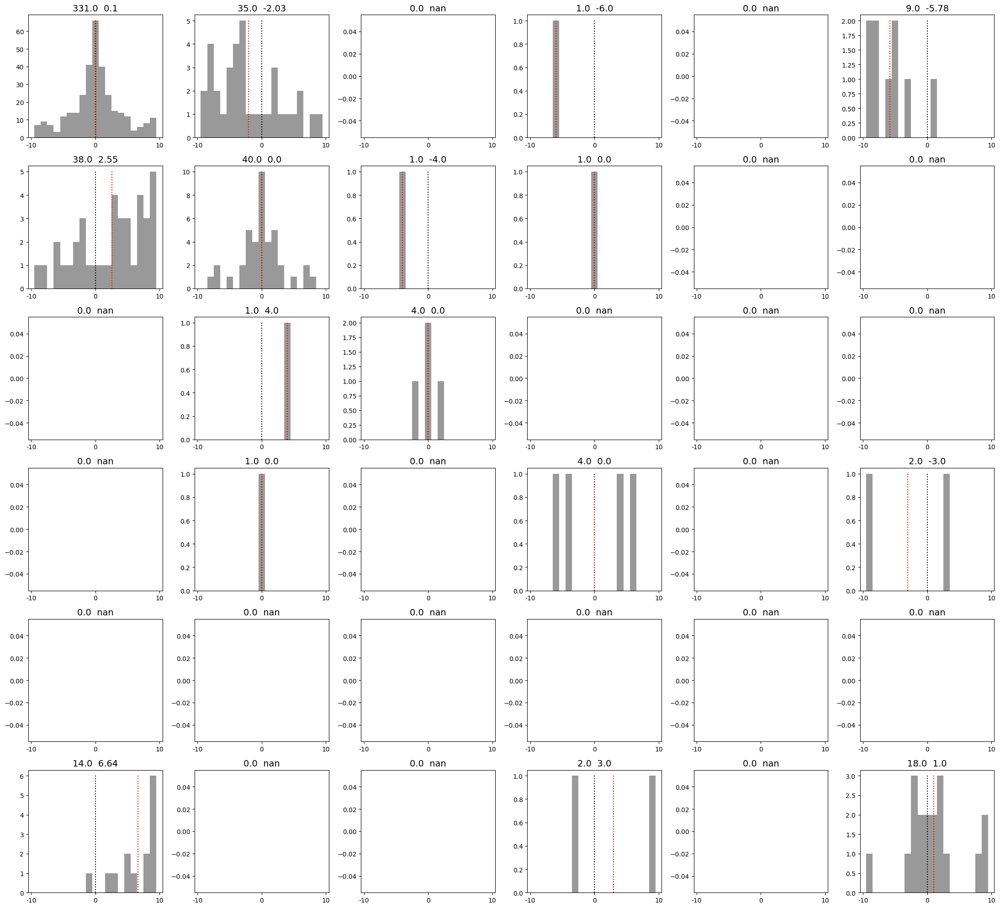

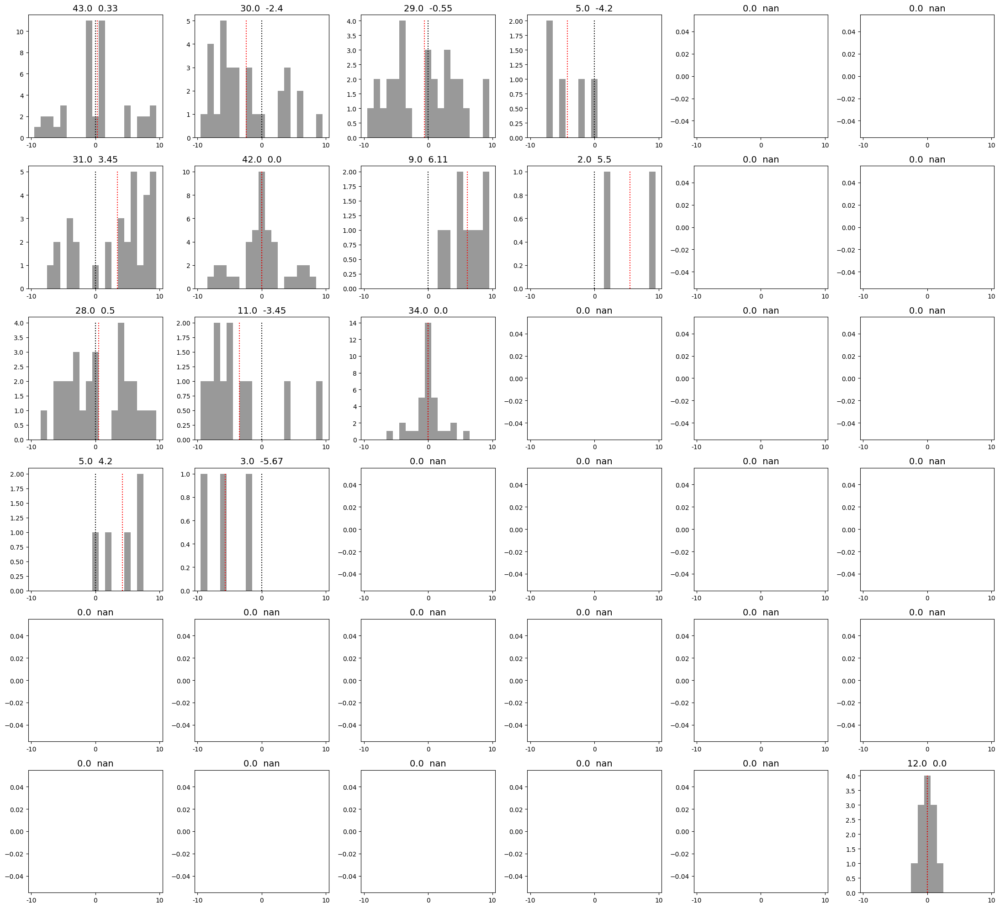

...

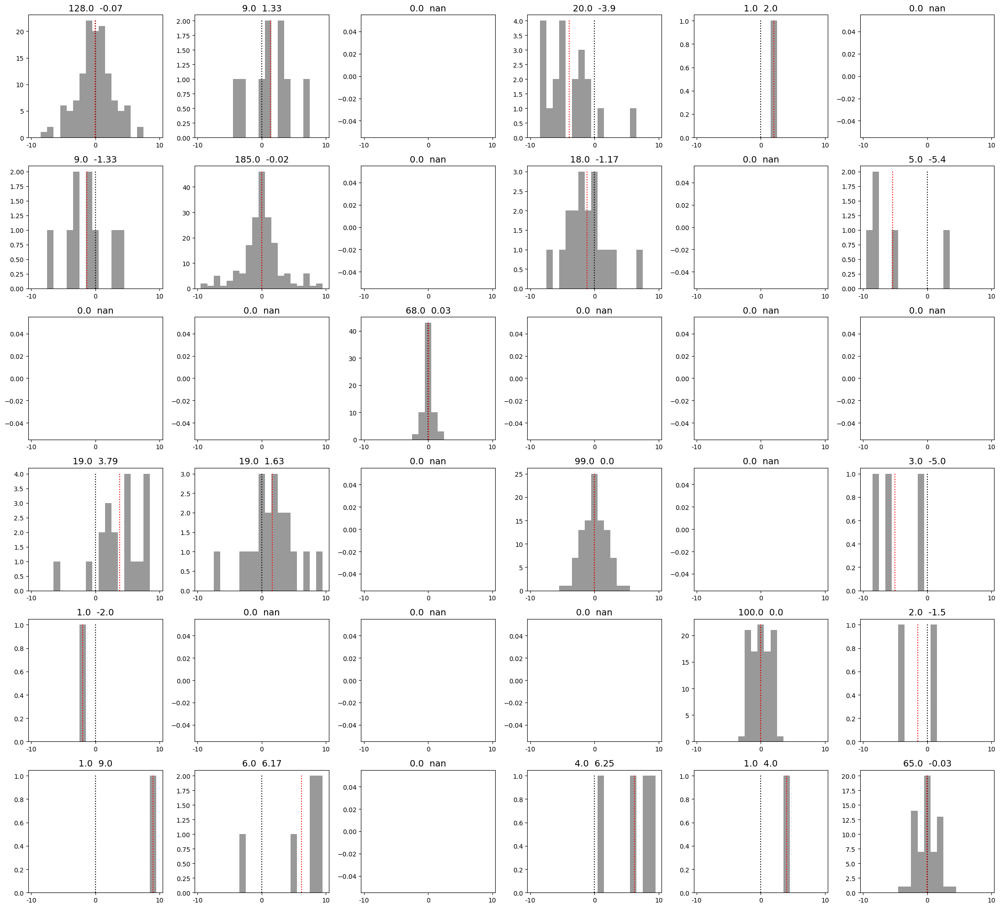

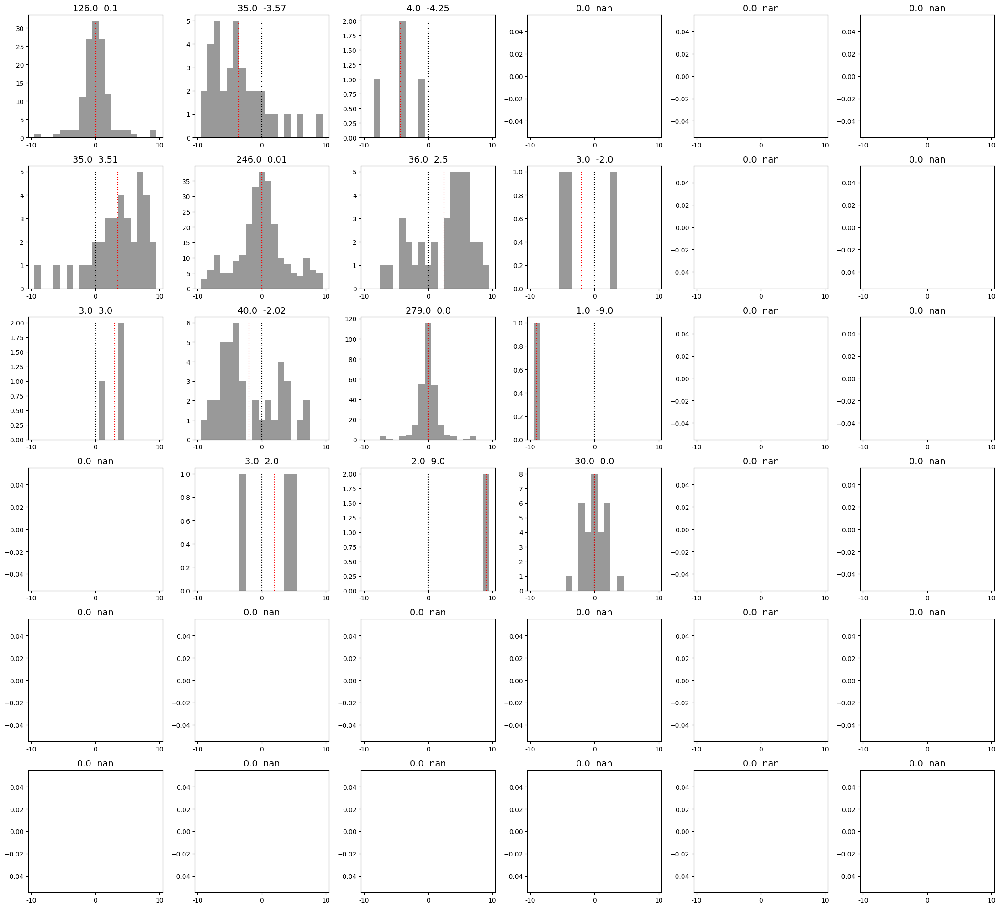

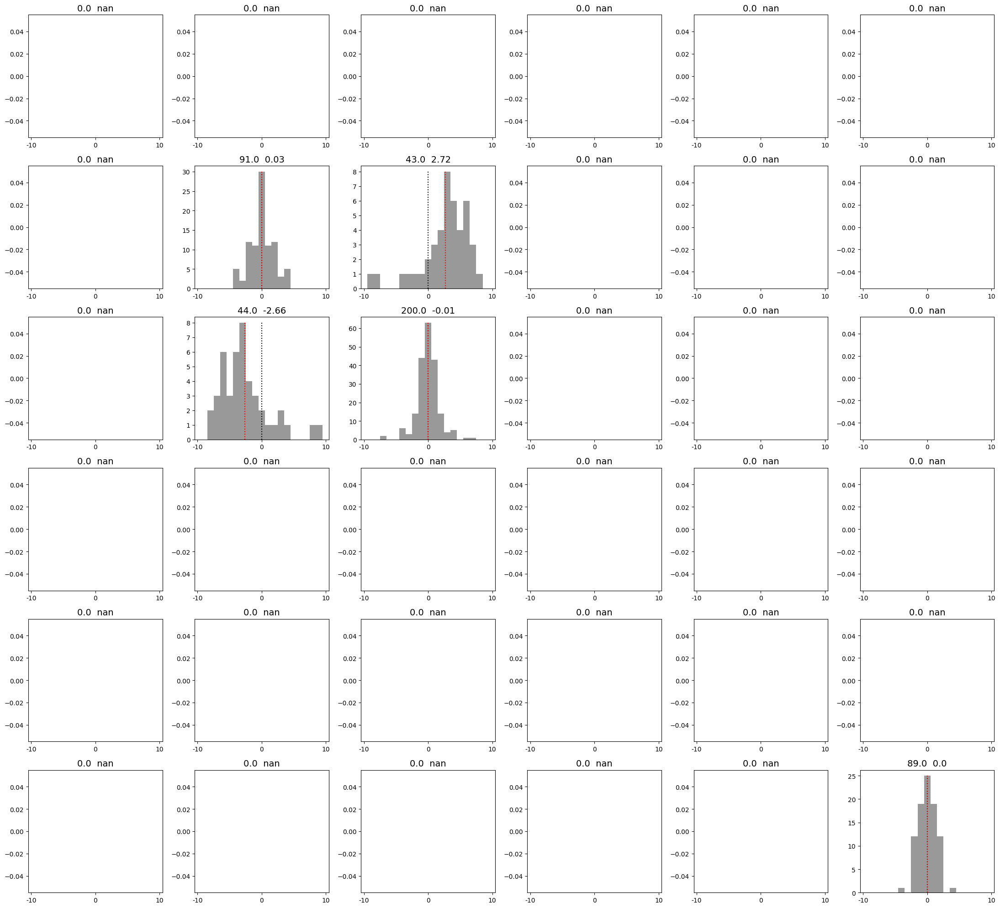

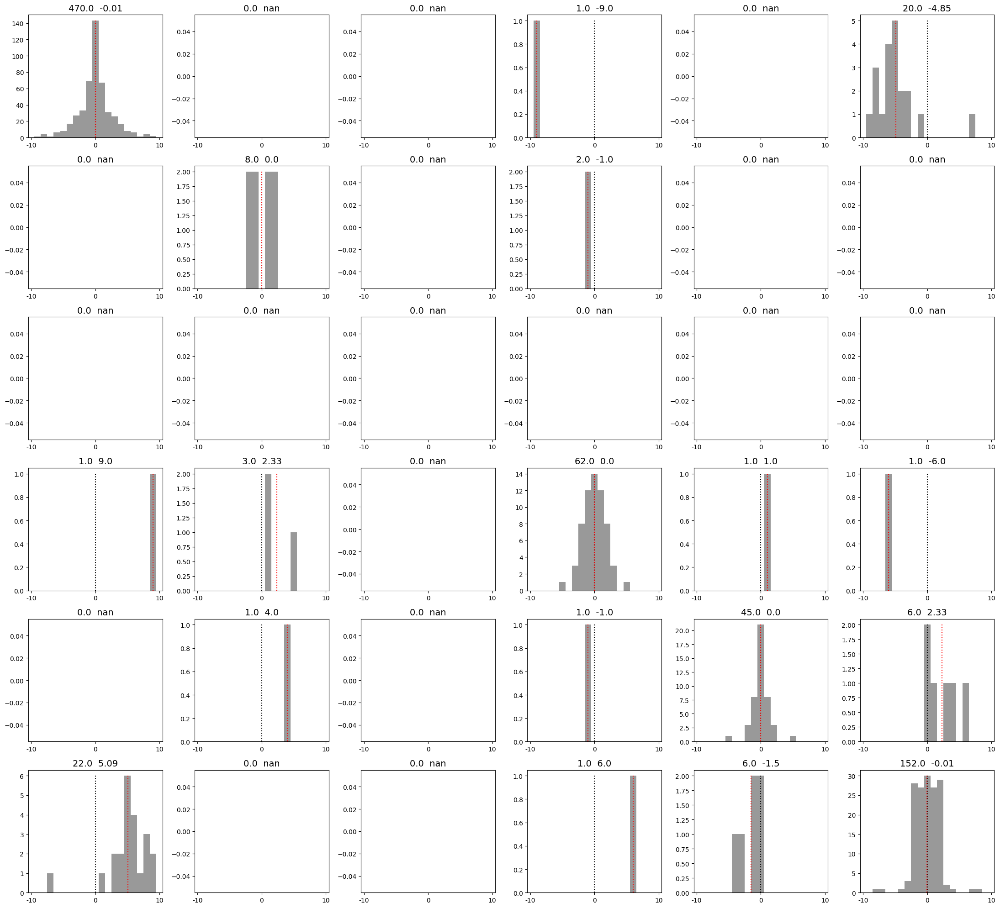

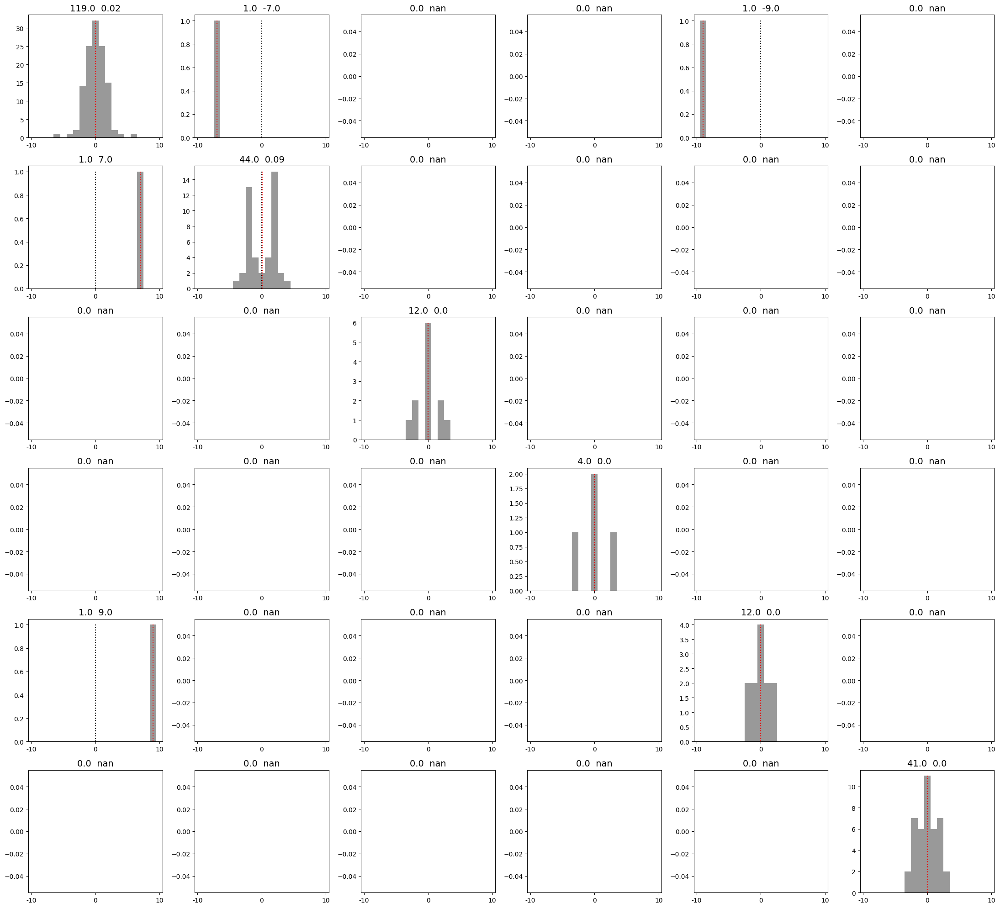

In [167]:
from scipy.stats import ttest_ind
from scipy.stats import ks_2samp, ranksums

basetype='CCG_grating_full_qc_high'
# load sharp peak with both threshold and window constraints
std=str(7)+str(10)
datatype= std+'std '+basetype

m=len(areas_all)

Verbose = True

mouse_IDs = ['412804', '412809', '415149','416356', '416357','416861','419112', '419114', '419116', 
             '419117', '419118', '419119', '424445',
             '434488','437661','448503',
              '433891', '432105', '432104',
            '437660', '429857', '434494',
            '425597', '415148', '418196']  #  need to process width, remove 394208, 434836, 434845

n_boot=1000
W_all=[]
P_all=[]
for mouse_ID in mouse_IDs:
    print(mouse_ID)
    basepath = '/Volumes/local1/work_allen/Ephys/resorted/mouse'+mouse_ID

    df = pd.read_csv(basepath+'/matrix/mouse'+mouse_ID+'_all_qc_meta.csv')
    df = df[df.FR>2]

    # add new column with grouped area ids
    areas = ['LGd', #LGN
             'VISp', 'VISl', 'VISal', 'VISrl', 'VISam', 'VISpm', 'VISmma', #VIS
             'LP','TH', # thalamus
             'MB','MGm', 'MGv', 'MGd', 'APN','Eth','POL','ProS' ,'NOT', 'VPM','RPF','SGN', 'PRE', 'POST', 'SUB', 'HPF', 'ZI', 'IntG', # others
             'DG','CA1', 'CA3', # hippo
             'none'   # not labeled
            ]

    df['areas_group']=np.zeros(len(df))
    for a in areas:
        df['areas_group'][df['ccf'].str.contains(a, case=False, na=False, regex=False)]=a

    ccg_basepath = '/Users/xiaoxuanj/work/work_allen/Ephys/processed_data/CCG_peak/mouse'
    ccg_peak = dl.load_npz(ccg_basepath+mouse_ID+'/ccg_peak_'+datatype+'.npz')
    ccg_peak_idx = dl.load_npz(ccg_basepath+mouse_ID+'/ccg_peak_offset_'+datatype+'.npz')
    areas = df.areas_group.unique()

    w, h = m, m;
    #CCG_amp = [[[] for x in range(w)] for y in range(h)] 
    CCG_offset = [[[] for x in range(w)] for y in range(h)] 

    for i, probei in enumerate(areas_all):
        for j, probej in enumerate(areas_all):
            if probei in areas and probej in areas:
                select_idxi = np.where(df.areas_group==probei)[0]
                select_idxj = np.where(df.areas_group==probej)[0]

                # mean amplitude for each pair of areas
                tmp = ccg_peak[select_idxi, :][:, select_idxj].flatten()
                # only consider significant positive connections
                select_peak = np.where(tmp!=0)[0]
                #print(len(select_peak))
                peak = np.nanmean(tmp[select_peak])
                # median peak offset for each pair
                tmp = ccg_peak_idx[select_idxi, :][:, select_idxj].flatten()
                tmp = tmp[select_peak]-100
                
                #if len(tmp)>3:
                    # ccg peak offset distribution
                CCG_offset[i][j] = CCG_offset[i][j]+list(tmp)
                
    
    # compute pairwise statistics:
    # Then for each pairs of hierarchically consecutive areas, compute the p-values from Wilcoxon paired signed rank sum test 
    # (See the section under # In[]: Wilcoxon matched pairs signed rank sum test). If the p-value is above 0.05, 
    # then those pairs cannot be meaningfully separated into different hierarchy levels.
    W=np.zeros((m-1, m))*np.NaN
    P=np.zeros((m-1, m))*np.NaN
    for i, probei in enumerate(areas_all[:-1]):
        for j, probej in enumerate(areas_all):
            if len(CCG_offset[i][j])>0 and len(CCG_offset[i+1][j])>0:
                w, p = ranksums(np.array(CCG_offset[i+1][j]), np.array(CCG_offset[i][j]))
                W[i,j]=w
                P[i,j]=p
    P_all.append(P)
    W_all.append(W)
    
    plt.figure(figsize=(22,20))
    N_connection=np.zeros((m,m))
    M=np.zeros((m,m))
    for i in range(m):
        for j in range(m):
            plt.subplot(m,m,i*m+j+1)
            a, bins, c = plt.hist(CCG_offset[i][j], bins=np.arange(-10,10,1), color='gray', alpha=0.8)
            #plt.title(areas_all[j]+'-'+areas_all[i], fontsize=15)
            plt.plot([-0.50,-0.50], [0, max(a)], ':k')
            # mean of bootstrapped median
            md = round(np.nanmean(CCG_offset[i][j]), 2)
            plt.plot([md+0.5,md+0.5], [0, max(a)], ':r')
            plt.xticks([-10.5,-0.5,9.5],[-10,0,10])
            plt.title(str(sum(a))+'  '+str(md+1), fontsize=14)
            #plt.title(str(area_names[i])+'-'+str(area_names[j]), fontsize=14)
            N_connection[i,j]=sum(a)
            M[i,j]=md+1
    plt.tight_layout()
    #plt.savefig('/Users/xiaoxuanj/work/work_allen/Ephys/figures/platform_paper/functional_connectivity/distribution_'+mouse_ID+'_20.pdf')



In [143]:
W_all=np.array(W_all)
P_all=np.array(P_all)

In [147]:
P_all[8]

array([[2.59423019e-08, 2.17821634e-06,            nan, 2.74338267e-05,
                   nan, 2.73321678e-01],
       [           nan, 2.27799994e-01, 8.32645167e-02,            nan,
                   nan, 2.11299547e-01],
       [           nan, 6.61573117e-02,            nan,            nan,
                   nan, 7.69697944e-01],
       [           nan, 8.87692624e-02,            nan, 9.08670869e-02,
        9.23265460e-02, 5.61275836e-01],
       [           nan, 1.33614403e-01,            nan, 1.43234908e-01,
        1.00000000e+00, 1.00000000e+00]])

In [142]:
np.where(np.array(mouse_IDs)=='419116')

(array([8]),)

In [132]:
p_total=np.ones((5,6))
for i in range(5):
    for j in range(6):
        tmp = P_all[:,i,j]
        ttmp=tmp[(np.isnan(tmp)!=1) & (tmp!=1)]
        print(ttmp)
        chi2, p = combine_p_Fisher(ttmp)
        p_total[i, j]=p

[3.41985556e-02 4.31042189e-24 1.06605395e-06 2.53734492e-03
 1.17408602e-02 8.98748141e-02 2.59423019e-08 8.52266363e-03
 2.04702687e-10 2.08224944e-03 4.25565062e-05 2.06187449e-01
 9.93473608e-08 8.58556028e-02]
[1.26437660e-02 1.27237360e-17 2.01936611e-02 2.21034651e-02
 1.45126311e-02 9.42643068e-02 2.17821634e-06 1.12145895e-03
 2.43130290e-08 4.46319076e-04 3.80517915e-06 1.51356497e-01
 9.43315661e-07 9.02692531e-02]
[9.18238351e-02 7.72058970e-01 1.24878116e-03 5.97561742e-06
 1.15805338e-02]
[1.08963542e-02 5.43848134e-08 6.31242217e-02 3.17310508e-01
 5.28075114e-02 2.74338267e-05 6.06019697e-02 2.97211354e-04
 1.21335250e-01 1.05250093e-02 2.20671362e-01]
[0.29762147 0.01002485 0.46421431 0.12133525]
[0.31731051 0.00867882 0.27332168 0.48745329 0.14323491]
[4.17788570e-02 9.81324641e-01 2.70793240e-04 2.82767025e-02
 1.62457588e-03 2.08851201e-01 5.69764368e-01]
[2.12314615e-02 8.66526950e-02 1.64914823e-01 1.76296374e-01
 9.65508625e-03 2.27799994e-01 2.13215343e-02 1.039

In [82]:
p_total[p_total>0.05]=1

In [125]:
tmp = P_all[:,0,0]
ttmp=tmp[(np.isnan(tmp)!=1) & (tmp!=1)]
print(ttmp)
chi2, p = combine_p_Fisher(ttmp)
print(chi2,p)

[3.41985556e-02 4.31042189e-24 1.06605395e-06 2.53734492e-03
 1.17408602e-02 8.98748141e-02 2.59423019e-08 8.52266363e-03
 2.04702687e-10 2.08224944e-03 4.25565062e-05 2.06187449e-01
 9.93473608e-08 8.58556028e-02]
(329.39669050917405, 0.0)


Text(0.5,1,'Fisher combined p-value across mice (ranksums)')

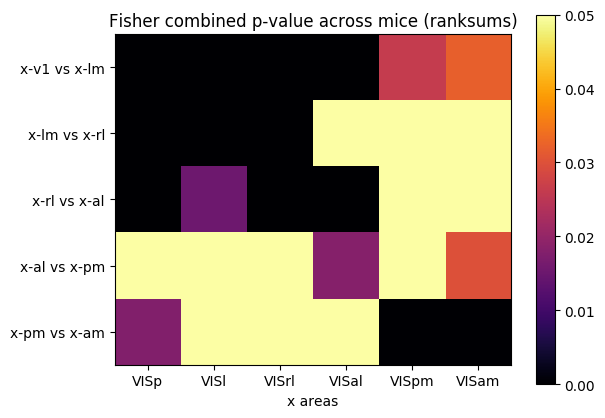

In [133]:
plt.imshow(p_total, cmap='inferno', vmin=0, vmax=0.05)
plt.colorbar()
plt.xticks(range(6), areas_all)
plt.yticks(range(5), ['x-v1 vs x-lm', 'x-lm vs x-rl', 'x-rl vs x-al', 'x-al vs x-pm', 'x-pm vs x-am'])
plt.xlabel('x areas')
plt.title('Fisher combined p-value across mice (ranksums)')
#plt.savefig('/Users/xiaoxuanj/work/work_allen/Ephys/figures/platform_paper/functional_connectivity/ks_stats.pdf')
#np.save('/Users/xiaoxuanj/work/work_allen/Ephys/figures/platform_paper/functional_connectivity/ks_stats.npy', p_total)

In [134]:
p_total[:,0]

array([0.00000000e+00, 1.88570386e-05, 2.43472604e-05, 8.12078520e-02,
       1.78158697e-02])

In [135]:
np.diag(p_total)

array([0.00000000e+00, 3.15334536e-10, 9.29547578e-07, 1.83167239e-02,
       3.24437238e-04])

In [92]:
np.log10(0.05)

-1.3010299956639813

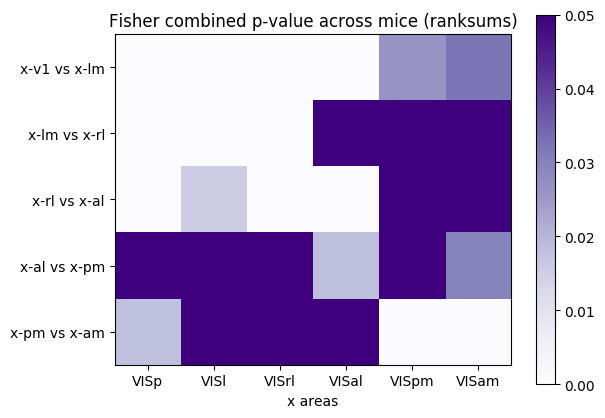

In [161]:
plt.imshow(p_total,cmap='Purples', vmax=0.05)
plt.colorbar()
plt.xticks(range(6), areas_all)
plt.yticks(range(5), ['x-v1 vs x-lm', 'x-lm vs x-rl', 'x-rl vs x-al', 'x-al vs x-pm', 'x-pm vs x-am'])
plt.xlabel('x areas')
plt.title('Fisher combined p-value across mice (ranksums)')
plt.savefig('/Users/xiaoxuanj/work/work_allen/Ephys/figures/platform_paper/functional_connectivity/ranksum_stats.pdf')
np.save('/Users/xiaoxuanj/work/work_allen/Ephys/figures/platform_paper/functional_connectivity/ranksum_stats.npy', p_total)